In [1]:
import torch
cuda_available = torch.cuda.is_available()
print("CUDA is available:", cuda_available)
if cuda_available:
    num_cuda_devices = torch.cuda.device_count()
    print("Number of CUDA devices:", num_cuda_devices)

    for i in range(num_cuda_devices):
        device_properties = torch.cuda.get_device_properties(i)
        print(f"CUDA device {i} properties:")
        print("  Name:", device_properties.name)
        print("  Memory Total (GB):", device_properties.total_memory / (1024 ** 3))


CUDA is available: True
Number of CUDA devices: 1
CUDA device 0 properties:
  Name: NVIDIA GeForce RTX 3050 Ti Laptop GPU
  Memory Total (GB): 3.99951171875


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pytesseract
import easyocr
import re
from collections import Counter
import pillowfight
import PIL

In [3]:
image = cv2.imread("marinto.png")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)
tesseract = pytesseract.image_to_string(blur)
text = tesseract.strip()
print(text)

e@ Q

SAVEETHA mer
ENGINEERING COLLEGE ‘ane <7 ("

An Autonomous Institution | Affiliated to Anna University, |, Approved by AICTE

LY

CWA dhib Seb D | a. 19. Moninto Richee T
212220230031
NAMSI5.9 - Stock Market

and Compare, Operredrion


In [4]:
def replace_wrong_detections(text):
  if len(text)>9:
    if re.search(r"\d+", text) and len(re.findall(r"\d", text)) / len(text) > 0.6:
      text = text.replace("|", "1")
      text = text.replace("/", "1")
      text = text.replace("o", "0")
  return text

In [5]:
def preprocess_image_for_text_detection_v1(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    # Contrast enhancement using histogram equalization
    enhanced_image = cv2.equalizeHist(upscaled_image)
    # Noise reduction using Gaussian blur
    blurred_image = cv2.GaussianBlur(enhanced_image, (3, 3), 1)
    # Thresholding to create a binary image
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # Morphological operations (dilation followed by erosion)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image

In [6]:
def preprocess_image_for_text_detection_v2(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(upscaled_image)
    blurred_image = cv2.GaussianBlur(enhanced_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [7]:
def preprocess_image_for_text_detection_v3(image):
    blurred_image = cv2.GaussianBlur(image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [8]:
def preprocess_image_for_text_detection_v4(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (5, 5), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [9]:
def preprocess_image_for_text_detection_v5(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    binary_image = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [10]:
def preprocess_image_for_text_detection_v6(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    morph_image = cv2.erode(morph_image, kernel, iterations=1)
    return morph_image


In [11]:
def preprocess_image_for_text_detection_v7(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
    return morph_image


In [12]:
def preprocess_image_for_text_detection_v8(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.bilateralFilter(upscaled_image, 9, 75, 75)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [13]:
def preprocess_image_for_text_detection_v9(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [14]:
def preprocess_image_for_text_detection_v10(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_GRADIENT, kernel)
    return morph_image


In [15]:
def preprocess_image_for_text_detection_v11(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_LINEAR)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [16]:
def preprocess_image_for_text_detection_v12(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = upscaled_image  # No Gaussian blur
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [17]:
def preprocess_image_for_text_detection_v13(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 127, 255, cv2.THRESH_TRUNC)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [18]:
def preprocess_image_for_text_detection_v14(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 127, 255, cv2.THRESH_TOZERO)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [19]:
def preprocess_image_for_text_detection_v15(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_TOPHAT, kernel)
    return morph_image


In [20]:
def preprocess_image_for_text_detection_v16(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    edges = cv2.Canny(upscaled_image, 100, 200)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [21]:
def preprocess_image_for_text_detection_v17(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_HITMISS, kernel)
    return morph_image


In [22]:
def preprocess_image_for_text_detection_v18(image):
    upscaled_image = cv2.resize(image, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return morph_image


In [23]:
from skimage.morphology import skeletonize
def preprocess_image_for_text_detection_v19(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    skeleton_image = skeletonize(binary_image/255).astype(np.uint8) * 255
    return skeleton_image


In [24]:
def preprocess_image_for_text_detection_v20(image):
    upscaled_image = cv2.resize(image, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)
    blurred_image = cv2.GaussianBlur(upscaled_image, (3, 3), 1)
    _, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((1, 1), np.uint8)
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_BLACKHAT, kernel)
    return morph_image


In [25]:
preprocess_functions_list = [
    preprocess_image_for_text_detection_v1,  # Original function (No Changes)
    preprocess_image_for_text_detection_v2,  # Enhanced Contrast using CLAHE
    preprocess_image_for_text_detection_v3,  # No Upscaling
    preprocess_image_for_text_detection_v4,  # Different Gaussian Blur Kernel Size
    preprocess_image_for_text_detection_v5,  # Different Thresholding Method
    preprocess_image_for_text_detection_v6,  # Erosion After Morphological Operations
    preprocess_image_for_text_detection_v7,  # Different Morphological Operation (Opening)
    preprocess_image_for_text_detection_v8,  # Bilateral Filtering
    preprocess_image_for_text_detection_v9,  # Different Thresholding Technique (Inverse Binary)
    preprocess_image_for_text_detection_v10,  # Different Morphological Operation (Gradient)
    preprocess_image_for_text_detection_v11,  # Different Upscaling Interpolation Method (Linear)
    preprocess_image_for_text_detection_v12,  # Removing Gaussian Blur
    preprocess_image_for_text_detection_v13,  # Different Thresholding Technique (Truncate)
    preprocess_image_for_text_detection_v14,  # Different Thresholding Technique (To Zero)
    preprocess_image_for_text_detection_v15,  # Different Morphological Operation (Top Hat)
    preprocess_image_for_text_detection_v16,  # Canny Edge Detection
    preprocess_image_for_text_detection_v17,  # Different Morphological Operation (Hit-or-Miss)
    preprocess_image_for_text_detection_v18,  # Different Upscaling Factor
    preprocess_image_for_text_detection_v19,  # Different Morphological Operation (Skeletonization)
    preprocess_image_for_text_detection_v20   # Different Morphological Operation (Black Hat)
]


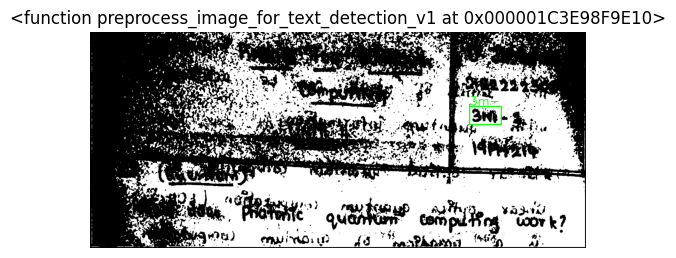

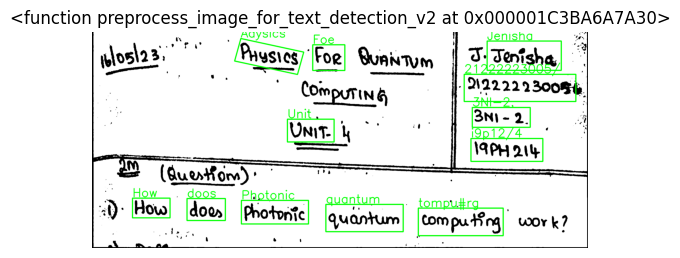

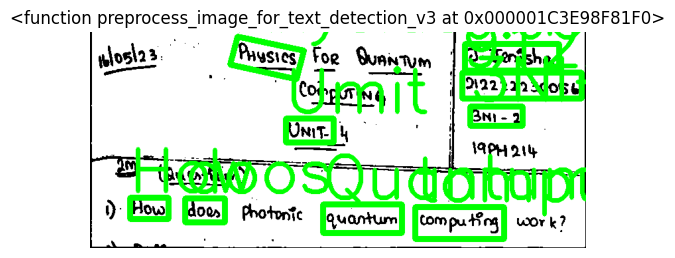

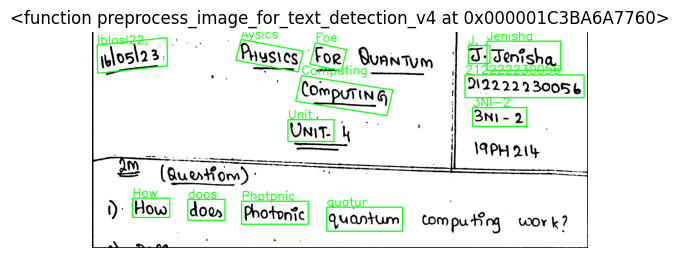

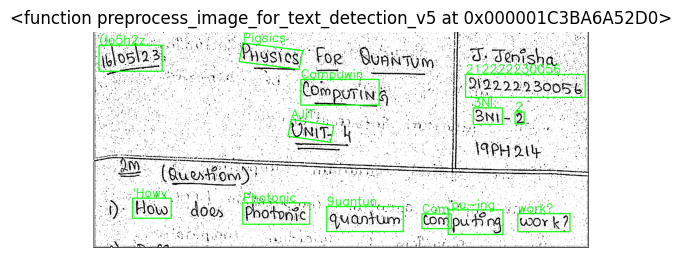

...

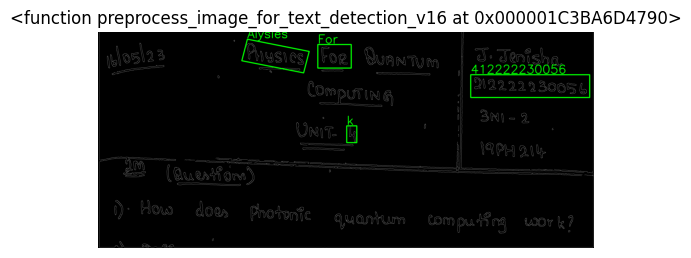

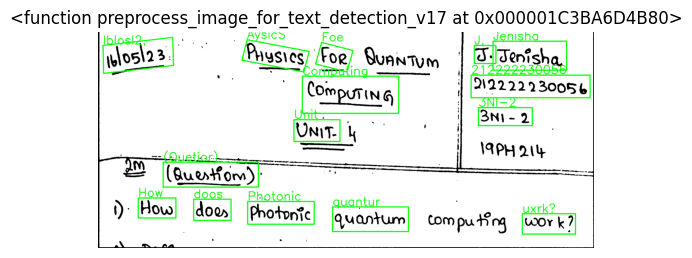

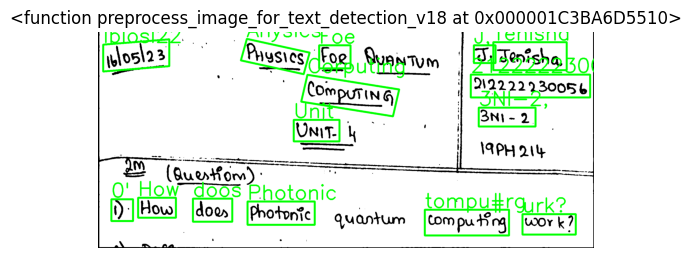

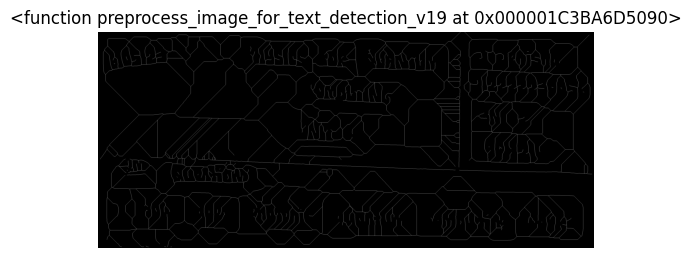

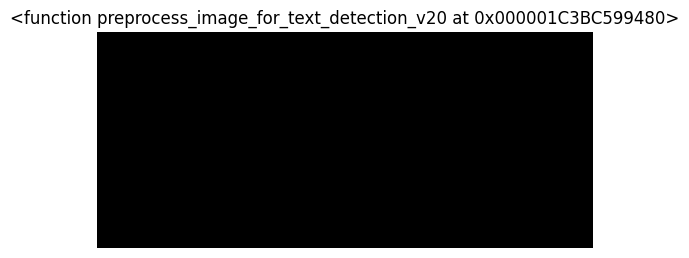

Most repeated 12-digit prediction: 212222230056
Count: 12


In [26]:
# Load the image
image_path = 'jen.png'
image = cv2.imread(image_path)
image=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
reader = easyocr.Reader(['en'],gpu=True) 
predictions_counter = Counter()
for function in preprocess_functions_list:
    processed_img=function(image)
    processed_img=cv2.cvtColor(processed_img, cv2.COLOR_RGB2BGR)
    result = reader.readtext(processed_img)
    # Display the result for predictions with confidence above 70%
    for bbox, text, score in result:
        if score > 0.4:
            #print(f'Text: {text}, Confidence: {score}')
            # Convert bbox to the format expected by cv2.polylines
            text=text.replace(" ","")
            if '|' in text:
                text=text.replace('|','1')
                print(text)
            if text.isdigit() and len(text) == 12:
                predictions_counter[text] += 1  # Increment the count for this 12-digit prediction
            pts = [(int(points[0]), int(points[1])) for points in bbox]
            pts = np.array(pts, dtype=np.int32)
            pts = pts.reshape((-1, 1, 2))
            cv2.polylines(processed_img, [pts], isClosed=True, color=(0, 255, 0), thickness=7)
            cv2.putText(processed_img, text, (pts[0][0][0], pts[0][0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 5)
    # Display the preprocessed image with bounding boxes and detected text
    plt.imshow(processed_img)
    plt.title(str(function))
    plt.axis('off')
    plt.show()
most_repeated_12_digit_prediction = predictions_counter.most_common(1)[0]
print("Most repeated 12-digit prediction:", most_repeated_12_digit_prediction[0])
print("Count:", most_repeated_12_digit_prediction[1])


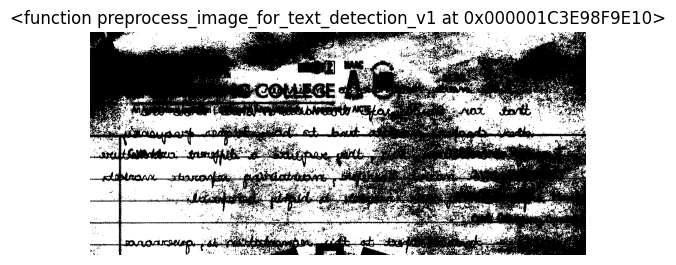

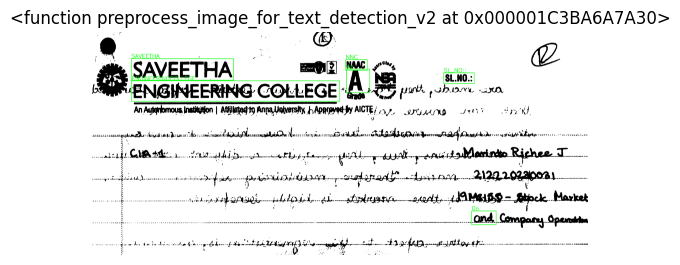

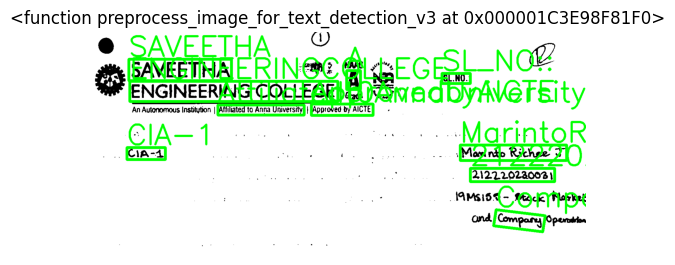

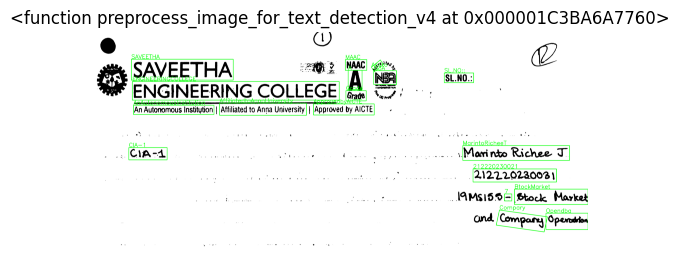

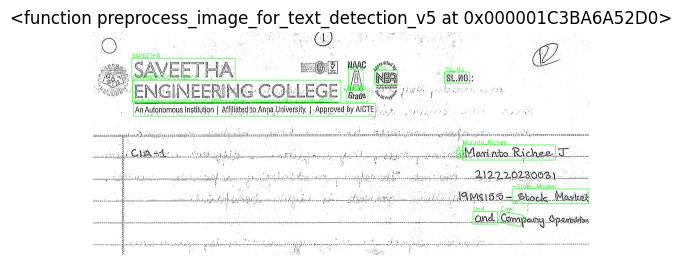

...

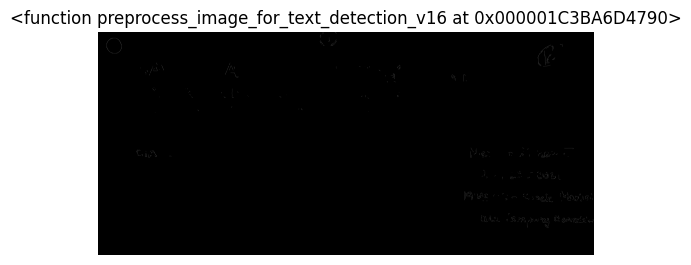

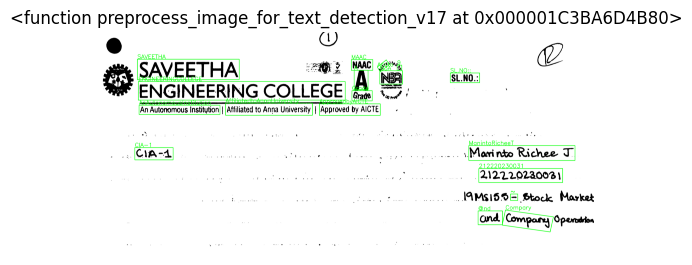

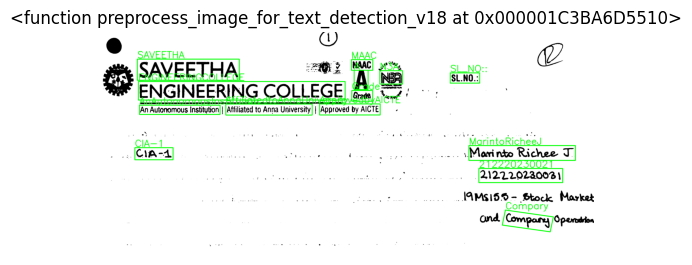

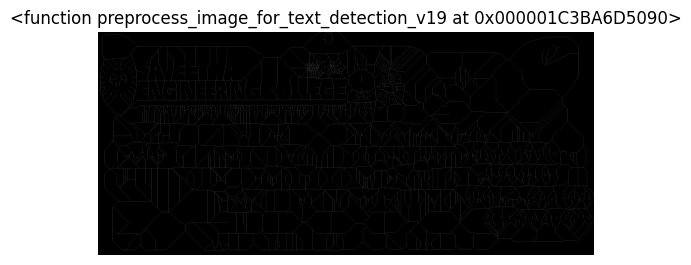

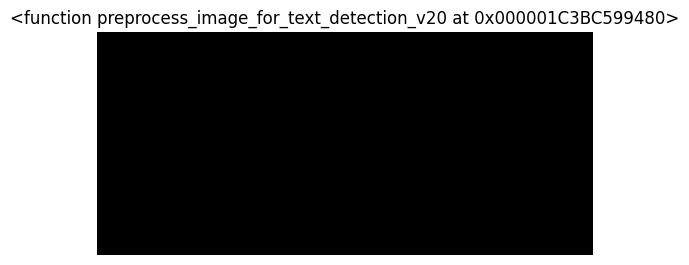

Most repeated 12-digit prediction: 212220230031
Count: 7


In [27]:
# Load the image
image_path = 'marinto.png'
image = cv2.imread(image_path)
image=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
reader = easyocr.Reader(['en'],gpu=True) 
predictions_counter = Counter()
for function in preprocess_functions_list:
    processed_img=function(image)
    processed_img=cv2.cvtColor(processed_img, cv2.COLOR_RGB2BGR)
    result = reader.readtext(processed_img)
    # Display the result for predictions with confidence above 70%
    for bbox, text, score in result:
        if score > 0.4:
            #print(f'Text: {text}, Confidence: {score}')
            # Convert bbox to the format expected by cv2.polylines
            text=text.replace(" ","")
            text=replace_wrong_detections(text)
            if re.search(r"\b\d{12}\b", text):
                predictions_counter[text] += 1 # Increment the count for this 12-digit prediction
            pts = [(int(points[0]), int(points[1])) for points in bbox]
            pts = np.array(pts, dtype=np.int32)
            pts = pts.reshape((-1, 1, 2))
            cv2.polylines(processed_img, [pts], isClosed=True, color=(0, 255, 0), thickness=7)
            cv2.putText(processed_img, text, (pts[0][0][0], pts[0][0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 5)
    # Display the preprocessed image with bounding boxes and detected text
    plt.title(str(function))
    plt.imshow(processed_img)
    plt.axis('off')
    plt.show()
most_repeated_12_digit_prediction = predictions_counter.most_common(1)[0]
print("Most repeated 12-digit prediction:", most_repeated_12_digit_prediction[0])
print("Count:", most_repeated_12_digit_prediction[1]) 

ENe::


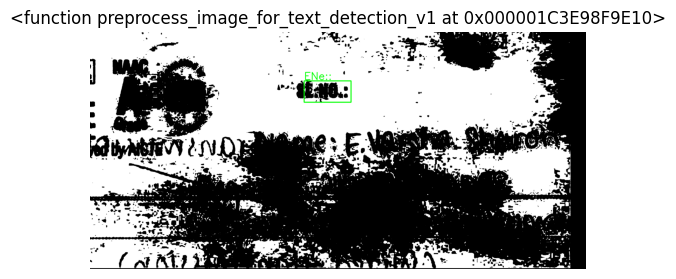

NANC
SL_NO::
4&
vedbyAICTE
Name:EVarsha
Sharon
'
212222i00058
2
SubjeckiCemputer_Netwwk
Peg
00:_


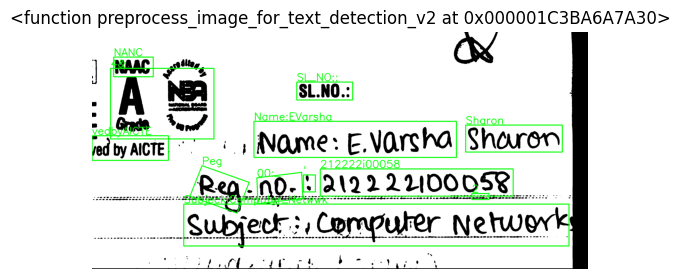

NNN
SL_NO_
A
vedbyAICTE
Name:EVarshaShoron
n0-:212222100058
Subject
:
ComputerNetwork
Re3


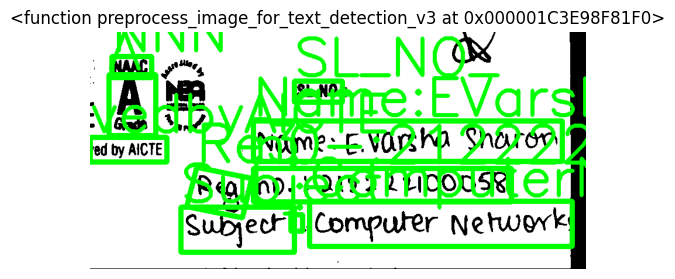

NAAC
SL.NO.:
Grada
A
8
vedbyAICTE
Name:EVarsha
Sharon
no-
212222i00058
Subject
:
ComputerNetwok
Pea


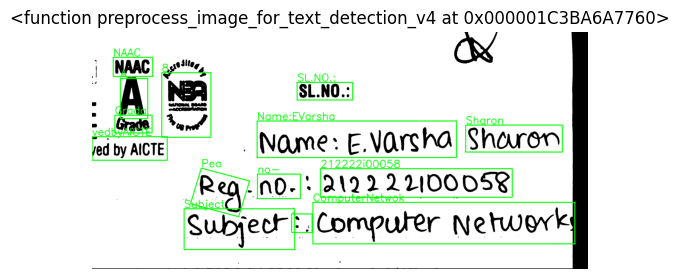

NRAC
A1
SL:NO_
5
'Grade
UG
tedby;AICTE
1e
E,Vars
Shcur
12222it
8
wher
Net


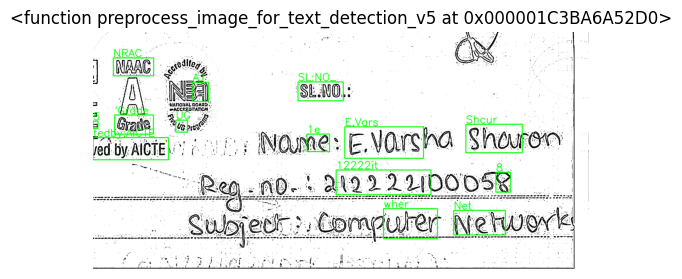

NAAC
SL.NO.:
Gradta
A
0
vedbyAICTE
Name:E,Varsha
Sharon
no-
212222i00058
Subject
:
ComputerNetwok
Pea


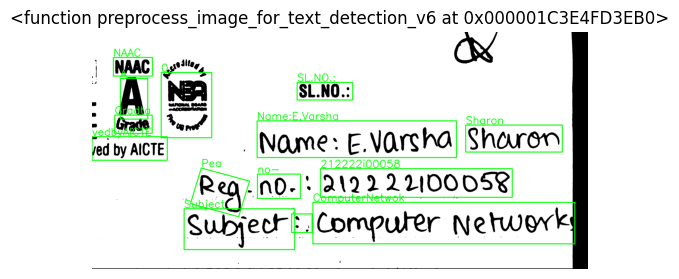

NAAC
SL.NO.:
Gradta
A
0
vedbyAICTE
Name:E,Varsha
Sharon
no-
212222i00058
Subject
:
ComputerNetwok
Pea


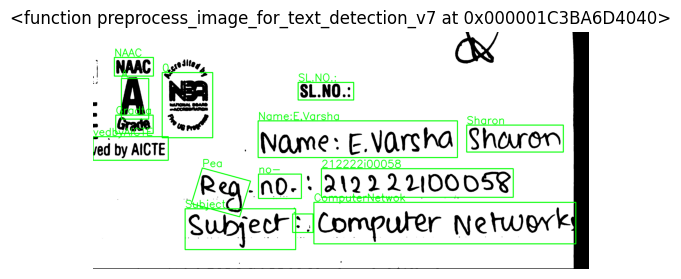

NAAC
A
@
SL.NO::
Gtracr
vedbyAICTE
Name:EVarsha
Sharon
no-
212222i00058
Subjeck:,ComputerNetwork


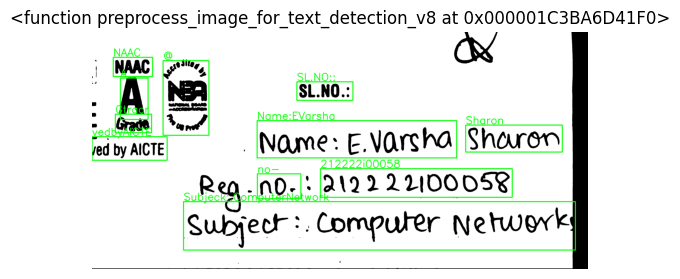

MAAC
A
N
SL.NO.
Grada
'edbyAICTE
Name:EVarsha
Sharon
n0-:21222i00058
Subject,ComputerNelwork
Ped


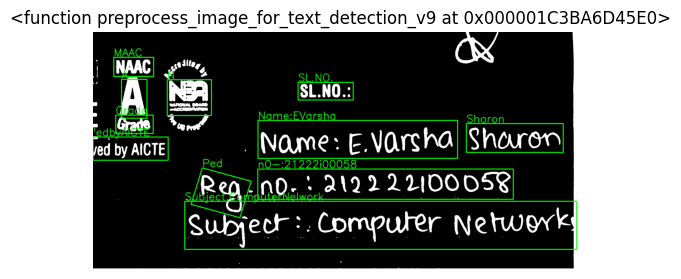

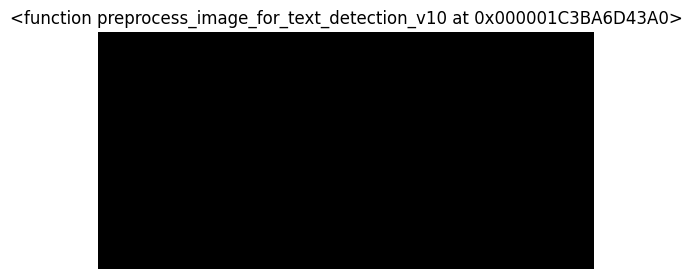

MAAC
A
0
SL_NO::
Graco
vedbyAICTE
Name:EVarsha
Sharon
no.
212222100058
Subjech:.ComputerNetwcrk
Pea


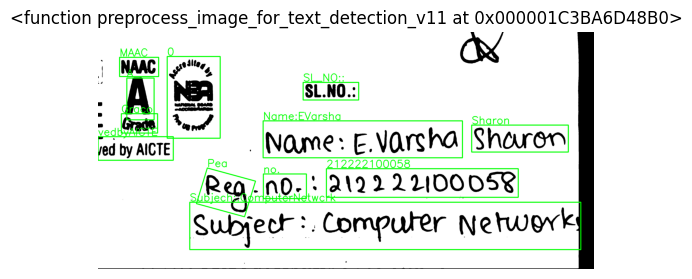

NAAC
SL.NO.:
Grada
A
9
vedbyAICTE
Name:EVarsha
Sharon
no.:21222ioo58
Subject
:
ComputerNetwok
Rea


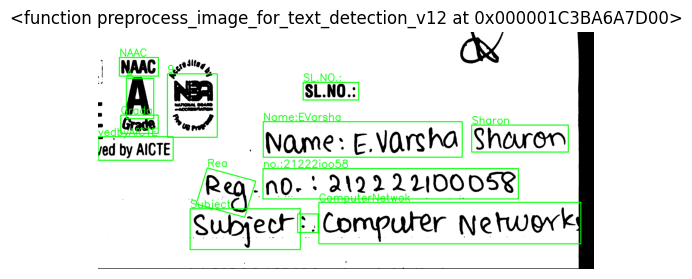

NAAC
9
A
N3A
SL.NO:
Grade
U
vedbyAICTE
Name:E.Varsha
Sharon
n0:212222100058
Subjech:ComputerNetwork
Jlled
Accto
'Actow
Rea


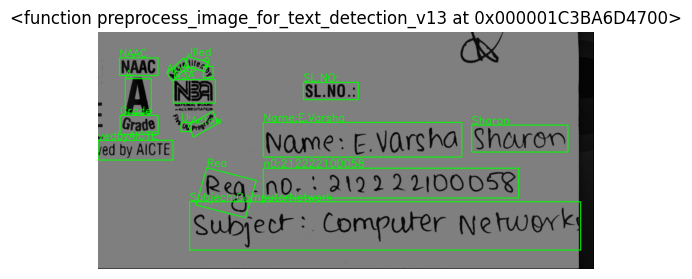

NAAC
"2
SL_NO::
Grada
A8
Name:EVarsha
Sharon
n0;:212222i00058
SubjechComputerNetwork
Pea


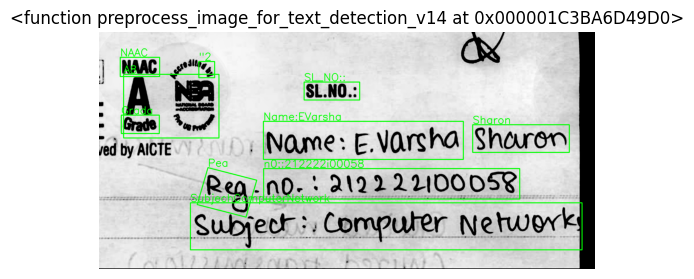

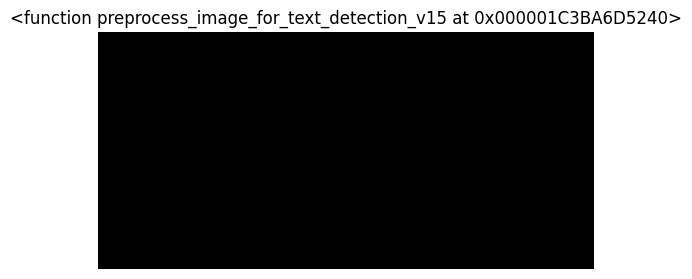

NNAc
2
SL_NOa
Cu&wICO3
Gsaeo
edbyAnCHe
Nane:EVerra
Sirsn
JldOa
CCGGO
3
1
Aea


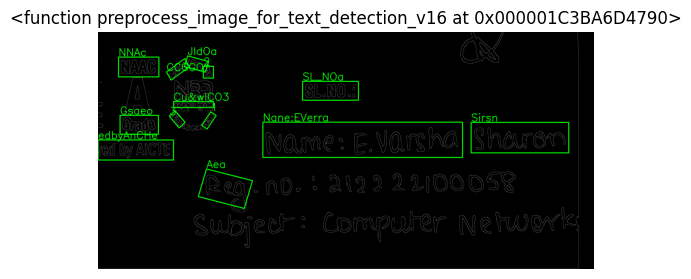

NAAC
SL.NO.:
Gradta
A
0
vedbyAICTE
Name:E,Varsha
Sharon
no-
212222i00058
Subject
:
ComputerNetwok
Pea


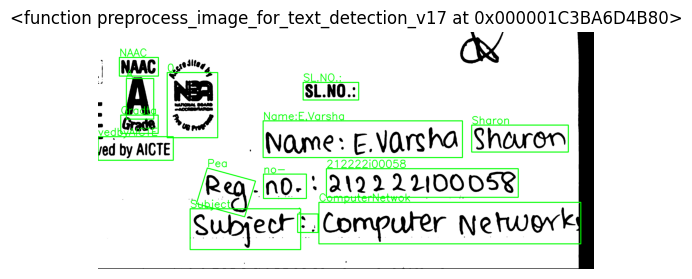

MAAC
A
0
SL_N.:
Grata
vedbyAICTE
Name:E.Varsha
Shcron
n0:212222i0058
Subject:,ComputerNehwork
Reg


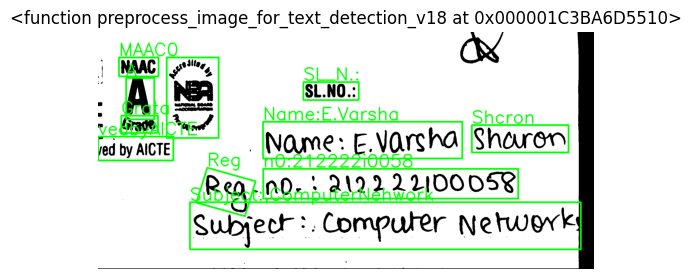

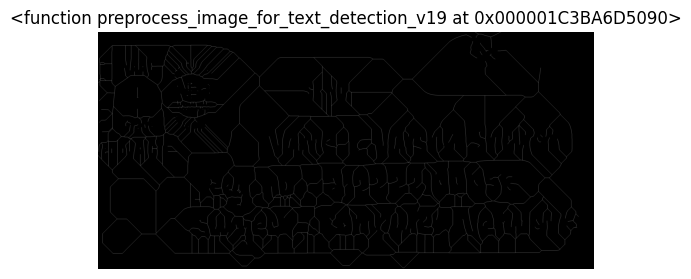

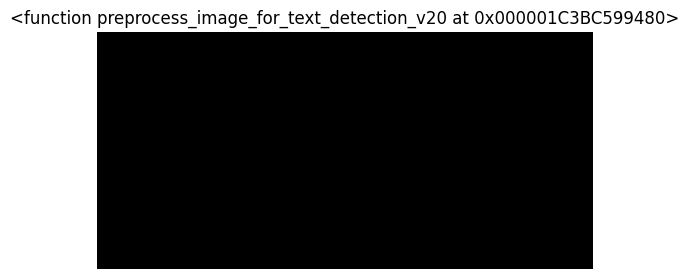

Most repeated 12-digit prediction: n0-:212222100058
Count: 1


In [28]:
# Load the image
input_img = PIL.Image.open("varsha.png")
output_img = pillowfight.ace(input_img)
image=cv2.cvtColor(np.array(output_img), cv2.COLOR_BGR2GRAY)
reader = easyocr.Reader(['en'],gpu=True) 
predictions_counter = Counter()
for function in preprocess_functions_list:
    processed_img=function(image)
    processed_img=cv2.cvtColor(processed_img, cv2.COLOR_RGB2BGR)
    result = reader.readtext(processed_img)
    # Display the result for predictions with confidence above 70%
    for bbox, text, score in result:
        if score > 0.1:
            #print(f'Text: {text}, Confidence: {score}')
            # Convert bbox to the format expected by cv2.polylines
            text=text.replace(" ","")
            text=replace_wrong_detections(text)
            if re.search(r"\b\d{12}\b", text):
                predictions_counter[text] += 1
                # Increment the count for this 12-digit prediction
            pts = [(int(points[0]), int(points[1])) for points in bbox]
            pts = np.array(pts, dtype=np.int32)
            pts = pts.reshape((-1, 1, 2))
            cv2.polylines(processed_img, [pts], isClosed=True, color=(0, 255, 0), thickness=7)
            cv2.putText(processed_img, text, (pts[0][0][0], pts[0][0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 5)
    # Display the preprocessed image with bounding boxes and detected text
    plt.imshow(processed_img)
    plt.title(str(function))
    plt.axis('off')
    plt.show()
most_repeated_12_digit_prediction = predictions_counter.most_common(1)[0]
print("Most repeated 12-digit prediction:", most_repeated_12_digit_prediction[0])
print("Count:", most_repeated_12_digit_prediction[1])

Wxrk?
5)
einol4


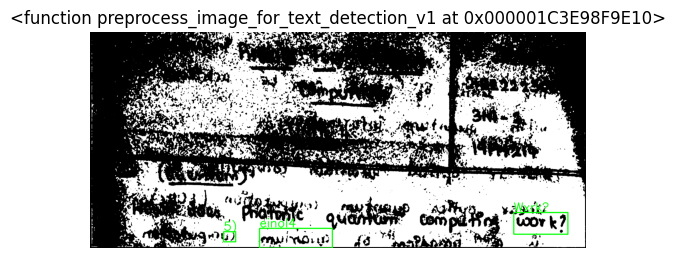

Lx
Foe
""
982222300
'doos
71
Wxrk?
OMiJ:
Aissic
Howsd,
i1.


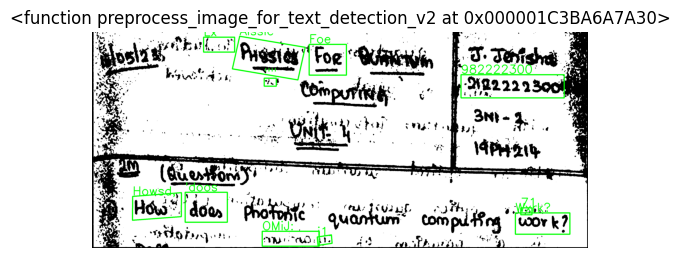

closhee;
Foe
J,Joisha
92222230036
3Ni-2,
UNit:
(Quemon))
How
doos
Photenic
quantum
tompuKrg
wprk?
Ahysig
Corqutunq


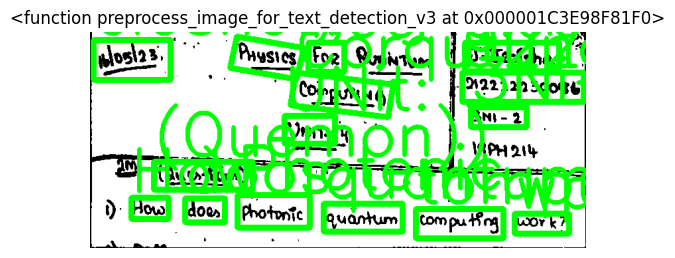

Foe
AuNwm
3,
Tenisha
212222230056
3NI-2.
Unit:
iqph2/4
(duesriorn)
0-
How
doos
Ahotonic
quantum
CompuRrg
wrk?
Ahysics
Iblosl2;,
Corputing


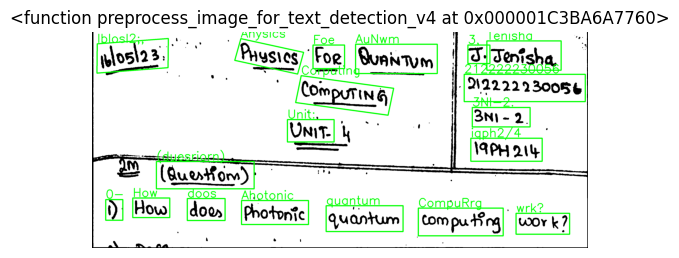

3
Hesics
Quanjum
Coxputin
9122222,30058
3NI;
2
(quexizom
How
Kantln
Wor:
Fop
Unit


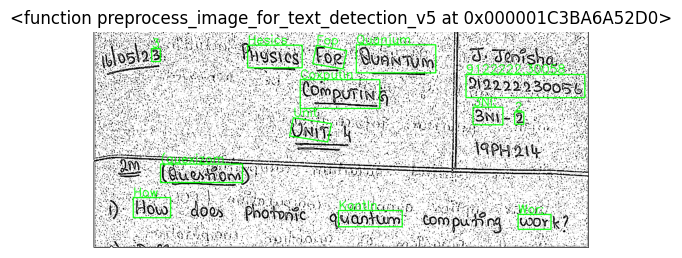

3,
Jenisha
Computing
212222230056
3NI-2.
Unit
iaph214
(duesrior)
0-
How
doos
Photonic
quantum
tompu+{rg
wrk?
Ahysics
Iblosl2e;
Foe
QaNwm


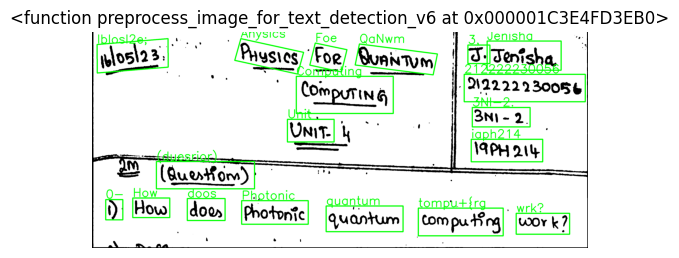

3,
Jenisha
Computing
212222230056
3NI-2.
Unit
iaph214
(duesrior)
0-
How
doos
Photonic
quantum
tompu+{rg
wrk?
Ahysics
Iblosl2e;
Foe
QaNwm


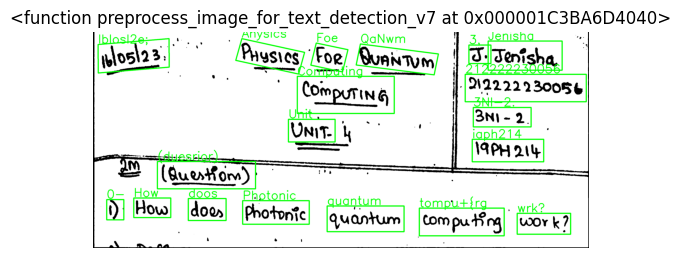

Auanwm
3,
Jenisha
Corputing
212222230056
3NI-2.
Unit:
iqfh2i4
(duestor)-
0
How)
doos
Photonic
Quontum
tompu#rg
Lxrk?
Ahysics
Ilosh2e,
Foe


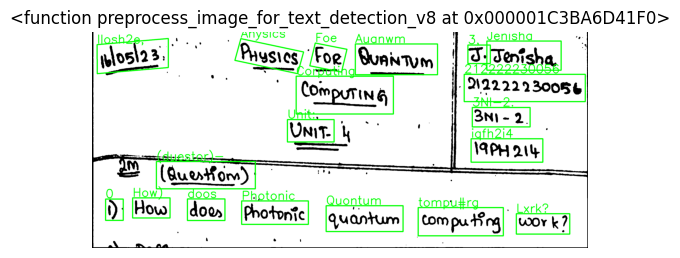

Foe
J,
Jenisha
COmPuTing
212222230056
3NI~2.
UNit6
Iqph2i4
(duetiom)
0'
How
doos
pbotonic
quatum
tompu#ng
Lrk?
Aysics
Ilosl23;


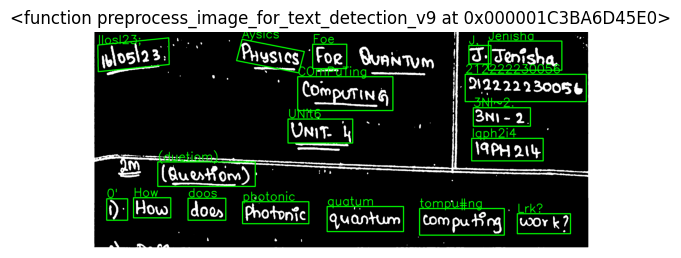

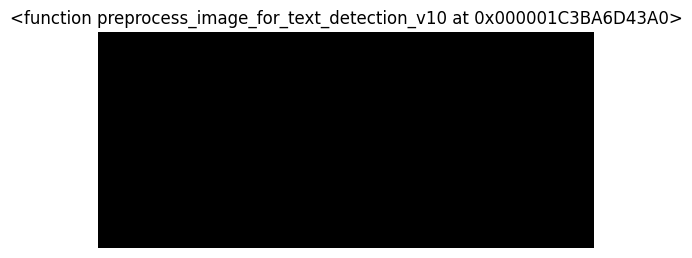

J,
Tenisha
Computing
912222220056
3NI-2.
Unit
(duestor)
0
How
doos
Ahotonic
quantum
tompu#rg
Lxrk?
Physics
Ibleshze,
Foe


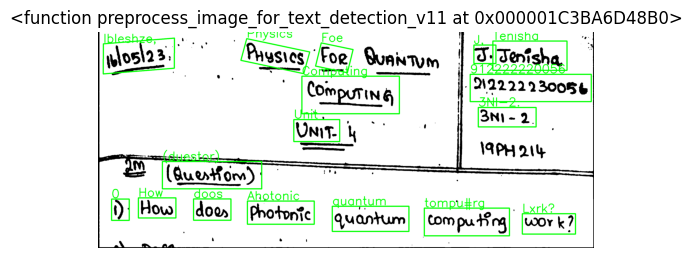

J,
Jenisha
Corputing
212222230056
3NI-2.
UNit
iaph2iy
(duesror)
0-
How
doos
Photonic
quantum
compu#rg
wrk?
Physics
Iblosl2e,
Foe


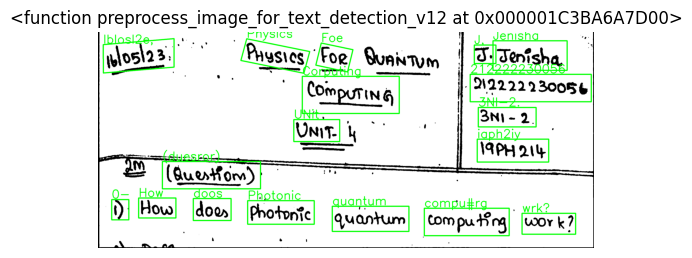

Foe
Ouanwm
J'
Tenisha
212222230056
3NI-2
Unit
I9Ph214
JM_
(Bueliom)
0
How
doos
Photonic
quantur
Compu4rg
work?
Physics
Iblo5l23'
Computing


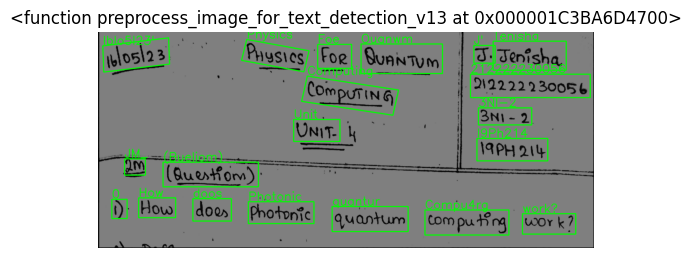

Fce
Buanwm
J,
Jenisha
912222230056
3NI-2.
Unit
i9ph2iy
I
(dueshfor)
0-
How
doos
Photonic
quantum
tomputrg
wxrk?
Aysics
Iblesh2e;
Coirputing


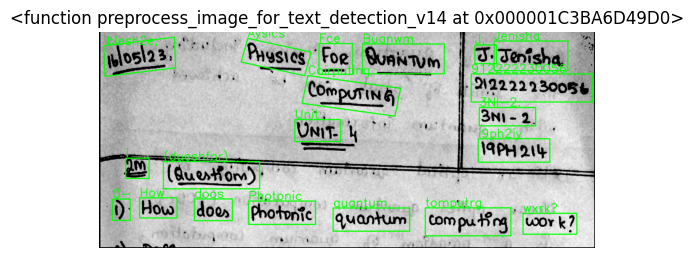

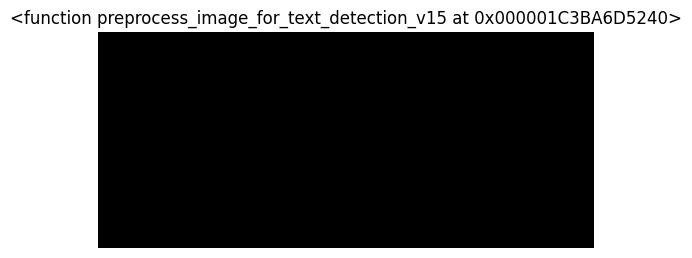

Foe
J,
93223083056
3N}=2
UJnov:
214
How
Joes
chotonie
@Ovk2
Anosics
Ilosl23'
iqph


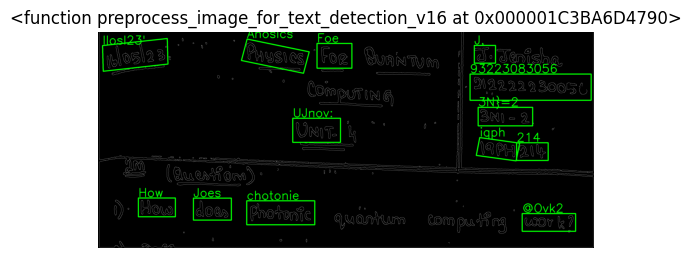

3,
Jenisha
Computing
212222230056
3NI-2.
Unit
iaph214
(duesrior)
0-
How
doos
Photonic
quantum
tompu+{rg
wrk?
Ahysics
Iblosl2e;
Foe
QaNwm


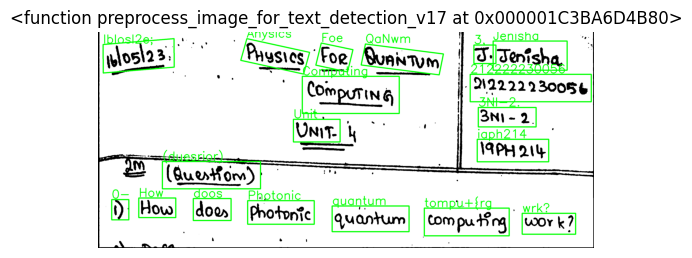

Iloshze'
Foe
BUanwum
T,
Jenisha
21222223056
3NI-2.
Unit
i9ph2iy
(Questor)
0.How
doos
Ahotonic
quantum
tompu+3rg
Ark?
Ahysics


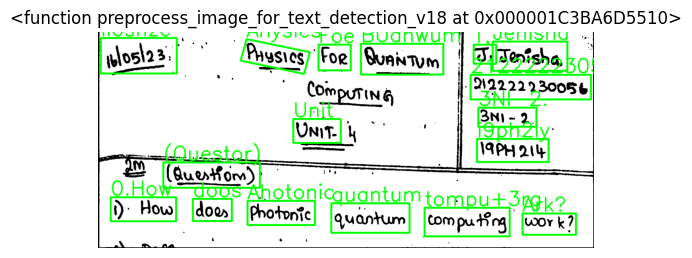

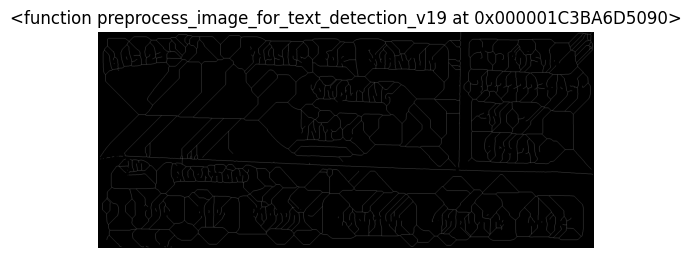

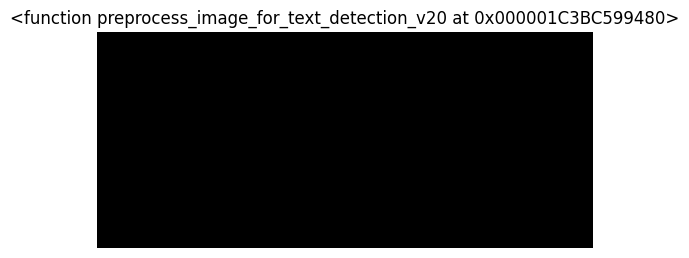

Most repeated 12-digit prediction: 212222230056
Count: 8


In [29]:
# Load the image
input_img = PIL.Image.open("jen.png")
output_img = pillowfight.ace(input_img)
image=cv2.cvtColor(np.array(output_img), cv2.COLOR_BGR2GRAY)
reader = easyocr.Reader(['en'],gpu=True) 
predictions_counter = Counter()
for function in preprocess_functions_list:
    processed_img=function(image)
    processed_img=cv2.cvtColor(processed_img, cv2.COLOR_RGB2BGR)
    result = reader.readtext(processed_img)
    # Display the result for predictions with confidence above 70%
    for bbox, text, score in result:
        if score > 0.1:
            #print(f'Text: {text}, Confidence: {score}')
            # Convert bbox to the format expected by cv2.polylines
            text=text.replace(" ","")
            text=replace_wrong_detections(text)
            if re.search(r"\b\d{12}\b", text):
                predictions_counter[text] += 1
                # Increment the count for this 12-digit prediction
            pts = [(int(points[0]), int(points[1])) for points in bbox]
            pts = np.array(pts, dtype=np.int32)
            pts = pts.reshape((-1, 1, 2))
            cv2.polylines(processed_img, [pts], isClosed=True, color=(0, 255, 0), thickness=7)
            cv2.putText(processed_img, text, (pts[0][0][0], pts[0][0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 5)
    # Display the preprocessed image with bounding boxes and detected text
    plt.imshow(processed_img)
    plt.title(str(function))
    plt.axis('off')
    plt.show()
most_repeated_12_digit_prediction = predictions_counter.most_common(1)[0]
print("Most repeated 12-digit prediction:", most_repeated_12_digit_prediction[0])
print("Count:", most_repeated_12_digit_prediction[1])

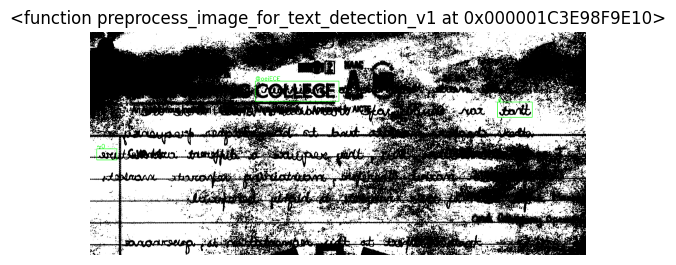

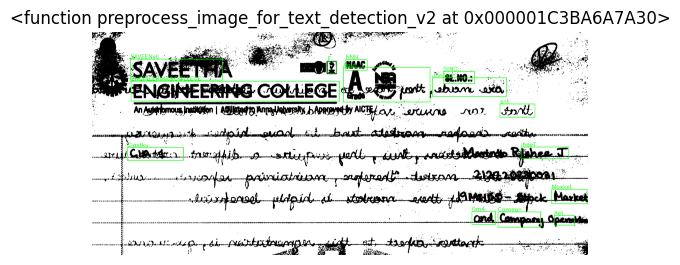

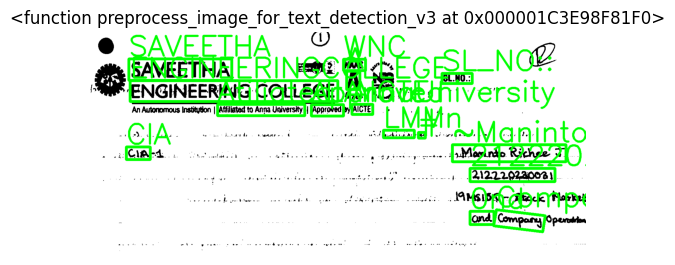

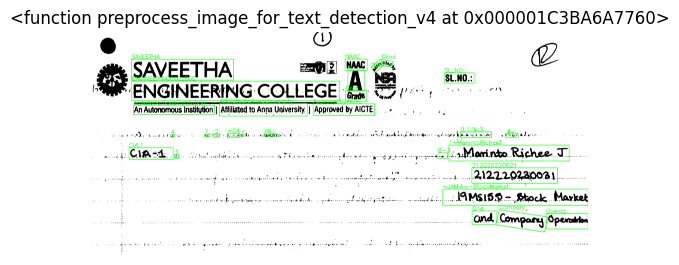

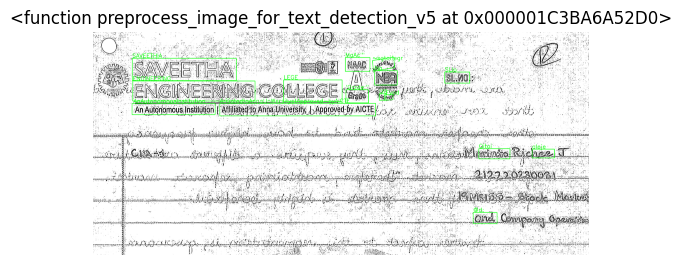

...

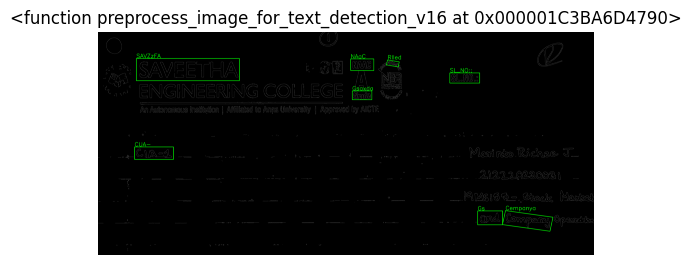

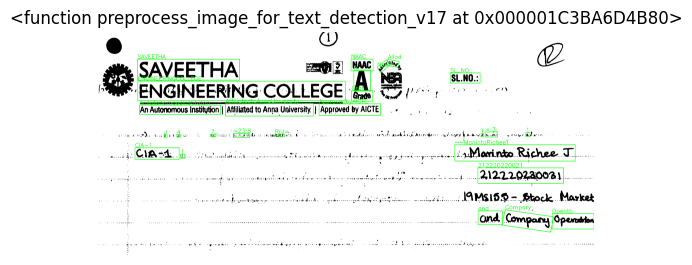

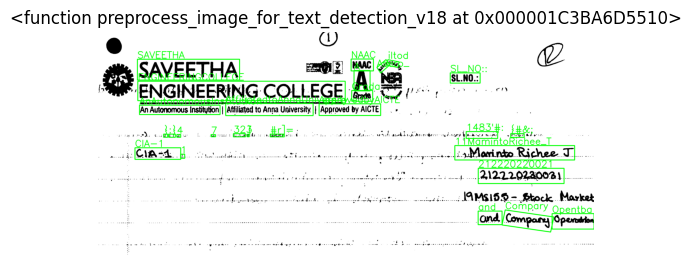

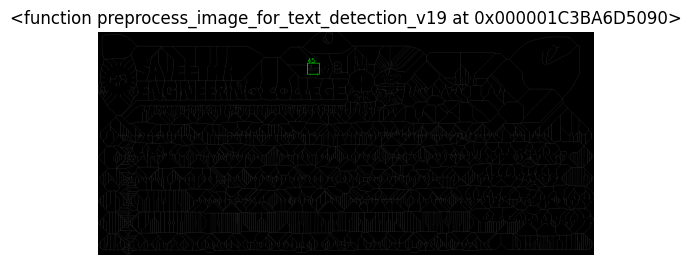

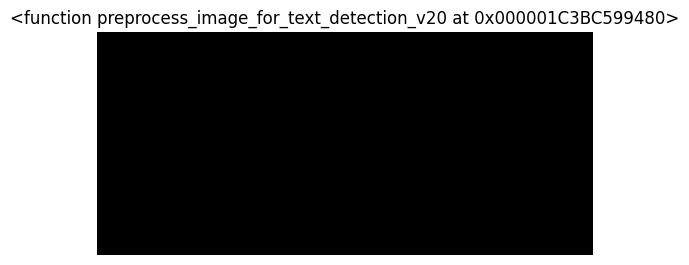

Most repeated 12-digit prediction: 212220220021
Count: 9


In [30]:
# Load the image
input_img = PIL.Image.open("marinto.png")
output_img = pillowfight.ace(input_img)
image=cv2.cvtColor(np.array(output_img), cv2.COLOR_BGR2GRAY)
reader = easyocr.Reader(['en'],gpu=True) 
predictions_counter = Counter()
for function in preprocess_functions_list:
    processed_img=function(image)
    processed_img=cv2.cvtColor(processed_img, cv2.COLOR_RGB2BGR)
    result = reader.readtext(processed_img)
    # Display the result for predictions with confidence above 70%
    for bbox, text, score in result:
        if score > 0.1:
            #print(f'Text: {text}, Confidence: {score}')
            # Convert bbox to the format expected by cv2.polylines
            text=text.replace(" ","")
            text=replace_wrong_detections(text)
            if re.search(r"\b\d{12}\b", text):
                predictions_counter[text] += 1
                # Increment the count for this 12-digit prediction
            pts = [(int(points[0]), int(points[1])) for points in bbox]
            pts = np.array(pts, dtype=np.int32)
            pts = pts.reshape((-1, 1, 2))
            cv2.polylines(processed_img, [pts], isClosed=True, color=(0, 255, 0), thickness=7)
            cv2.putText(processed_img, text, (pts[0][0][0], pts[0][0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 5)
    # Display the preprocessed image with bounding boxes and detected text
    plt.imshow(processed_img)
    plt.title(str(function))
    plt.axis('off')
    plt.show()
most_repeated_12_digit_prediction = predictions_counter.most_common(1)[0]
print("Most repeated 12-digit prediction:", most_repeated_12_digit_prediction[0])
print("Count:", most_repeated_12_digit_prediction[1])